# Signal-to-noise ratio estimation
[Signal-to-noise ratio](https://en.wikipedia.org/wiki/Signal-to-noise_ratio) (SNR) measures the relative power of the signal with respect to the background noise.

While modern studio gear has become very silent, vintage equipment such as tape recorders produces audible background noise.
While some people argue that this type of background noise is musically pleasant, and defines the style of the epoch, quantifying it may be interesting for some applications.

## A synthetic example

Let's start by creating a simple sinusoid plus white noise representing the signal and noise parts:

In [1]:
from IPython.display import Audio
from essentia import array, instantPower, db2amp
from essentia.standard import MonoLoader, SNR, FrameGenerator
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (12, 9)

EPS = np.finfo(np.float32).eps

Signal level: -13.01dB
Noise level: -59.99dB
SNR: 46.98dB


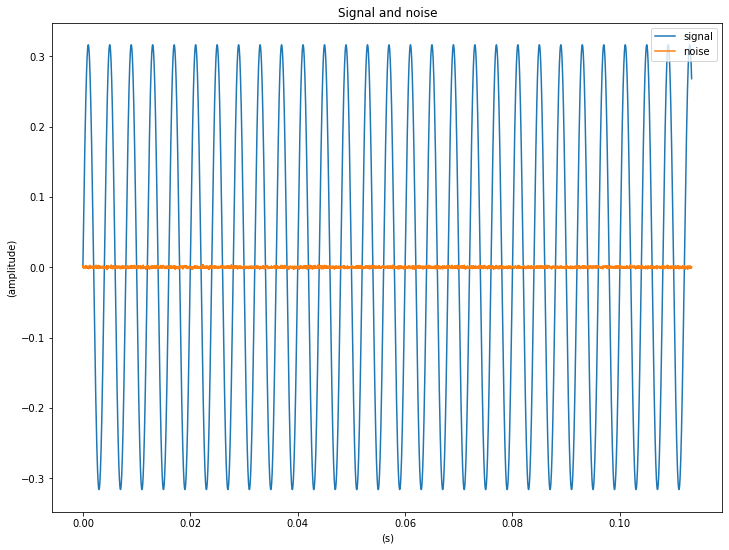

In [2]:
sr = 44100
time = 5  # s
signal_freq = 250
noise_only = 1

signal_db = -10
noise_db = -60

frame_size = 512

time = np.arange(sr * time) / sr

noise = np.random.randn(len(time)).astype(np.float32)
noise *= db2amp(noise_db)

signal = np.sin(2 * np.pi * signal_freq * time).astype(np.float32)
signal *= db2amp(signal_db)

signal_power = instantPower(signal)
noise_power = instantPower(noise)
true_snr = 10 * np.log10( signal_power / noise_power)

plt.plot(time[:5000], signal[:5000], label='signal')
plt.plot(time[:5000], noise[:5000], label='noise')
plt.title('Signal and noise')
plt.xlabel("(s)")
plt.ylabel("(amplitude)")
plt.legend()

print('Signal level: {:.2f}dB'.format(10. * np.log10(signal_power)))
print('Noise level: {:.2f}dB'.format(10. * np.log10(noise_power)))
print('SNR: {:.2f}dB'.format(true_snr))

Notice how the noise can be noticed despite achieving  `~47 dB` of SNR.

In [3]:
Audio(signal + noise, rate=sr)

This is because the power of the signal is concentrated in a single frequency while the power of the noise spreads across the spectrum.
For this reason, when the noise is broadband and the signal is narrowband, it is common to correct the SNR to the bandwidth:

In [4]:
corrected_snr = true_snr - 10 * np.log10(sr / 2)

print("SNR corrected: {:.2f}dB".format(corrected_snr))

SNR corrected: 3.55dB


## Estimating the SNR

[SNR](https://essentia.upf.edu/reference/std_SNR.html) computes the SNR of the input audio stream in a framewise manner.
The algorithm assumes that:

1. The noise is gaussian.
2. There is a region of noise (without signal) at the beginning of the stream that can be used to estimate the Power Spectral Denstity (PSD) of the noise [1].

These requirements are easily satisfied in many scenarios (silence before the first word on phone calls, tape hiss in music before the music starts, background noise before the event in event detection recordings, etc.).

Let's simulate this scenario by creating a new audio stream consisting of a few seconds of noise only followed by signal plus noise:

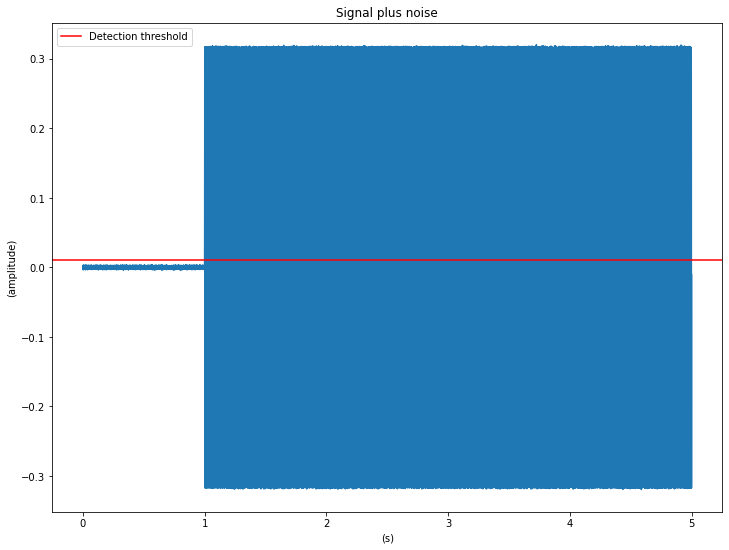

In [5]:
threshold = -40

signal[:noise_only * sr] = np.zeros(noise_only * sr)

signal_and_noise = signal + noise

time = np.arange(len(signal_and_noise)) / sr

plt.plot(time, signal_and_noise)
plt.axhline(db2amp(threshold), color='r', label='Detection threshold')
plt.title('Signal plus noise')
plt.xlabel("(s)")
plt.ylabel("(amplitude)")
plt.legend()

Once the noise PSD is estimated, the algorithm relies on the Ephraim-Malah [2] recursion to estimate the SNR for each frequency bin.
The algorithm also returns an overall (a single value for the whole spectrum) SNR estimation and a temporally-averaged SNR estimation using an Exponential Moving Average filter.
As the signal is also a stationary process, the EMA SNR estimation should converge to the true SNR computed from the separated signals:

In [6]:
def compute_snr(audio, threshold, broadbad_correction=False):
    frame_size = 512

    snr = SNR(
        frameSize=frame_size,
        noiseThreshold=threshold,
        useBroadbadNoiseCorrection=broadbad_correction,
    )

    snr_spectral_list = []
    for frame in FrameGenerator(
        audio,
        frameSize=frame_size,
        hopSize=frame_size // 2,
    ):
        snr_instant, snr_ema, snr_spetral = snr(frame)
        snr_spectral_list.append(snr_spetral)

    snr_spectral = array(snr_spectral_list).T

    return snr_ema, snr_spectral

In [7]:
snr_ema, snr_spectral = compute_snr(signal_and_noise, threshold, broadbad_correction=True)

print(f"estimated a priori SNR: {snr_ema:.2f}dB")

estimated a priori SNR: 3.60dB


For some applications, it is useful to have the estimated SNR across time and frequency.
This matrix is traditionally used for denoising applications [2], however, this topic is not covered in this example.

*Note that the empty part at the beginning corresponds with the noise PSD estimation part of the algorithm.*

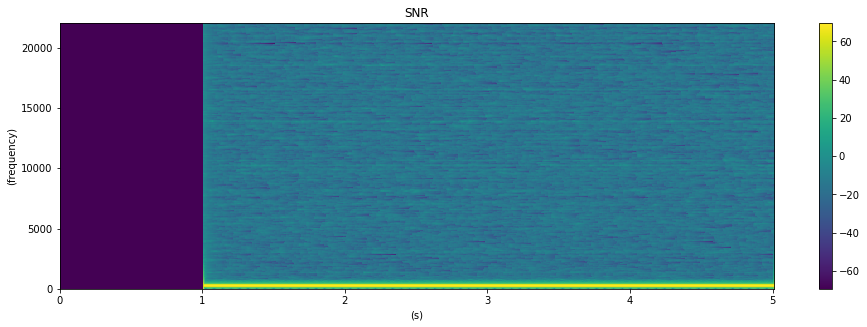

In [8]:
plt.matshow(
    10 * np.log10(snr_spectral + EPS),
    extent=[0, snr_spectral.shape[1] * 256 / sr, 0, sr / 2],
    aspect='auto',
    origin='lower',
)
plt.colorbar()
plt.title('SNR')
plt.xlabel("(s)")
plt.ylabel("(frequency)")
plt.gca().xaxis.set_ticks_position("bottom")

## Setting the detection threshold

A proper threshold setting is crucial to obtain a valid SNR estimation.
Otherwise, two problems may occur:

- **threshold higher than the signal:** In this case, the whole audio will be considered as noise resulting in **-inf** SNR.
- **threshold lower than noise:** In this case, the whole audio will be considered as signal estimating **inf** SNR.

In [9]:
print(f"threshold too high to detect the signal: {compute_snr(signal_and_noise * .9, threshold=0)[0]} dB")
print(f"threshold too low to detect the noise: {compute_snr(signal_and_noise, threshold=-90)[0]} dB")

threshold too high to detect the signal: -inf dB
threshold too low to detect the noise: inf dB


## Real examples

Let's see the algorithm working on a couple of old recordings with audible background noise:

In [10]:
audio_file = "audio/mozart_c_major_30sec.wav"
audio_mozart = MonoLoader(filename=audio_file)()
snr_ema_mozart, snr_spectral_mozart = compute_snr(audio_mozart, threshold)

audio_file = "audio/Vivaldi_Sonata_5_II_Allegro.wav"
audio_vivaldi = MonoLoader(filename=audio_file)()
snr_ema_vivaldi, snr_spectral_vivaldi = compute_snr(audio_vivaldi, threshold)

The first one is a 30 seconds excerpt of Mozart:

In [11]:
Audio(audio_mozart, rate=sr)

A fragment of Vivaldi's Sonata 5:

In [12]:
Audio(audio_vivaldi, rate=sr)

In [13]:
print(f"Estimated a priori SNR in the Mozart example: {snr_ema_mozart:.2f}dB")
print(f"Estimated a priori SNR in the Vivaldi example: {snr_ema_vivaldi:.2f}dB")

Estimated a priori SNR in the Mozart example: 22.44dB
Estimated a priori SNR in the Vivaldi example: 3.27dB


Do the estimated SNR values match your perception?

Let's try to understand what is going on from the spectral perspective:

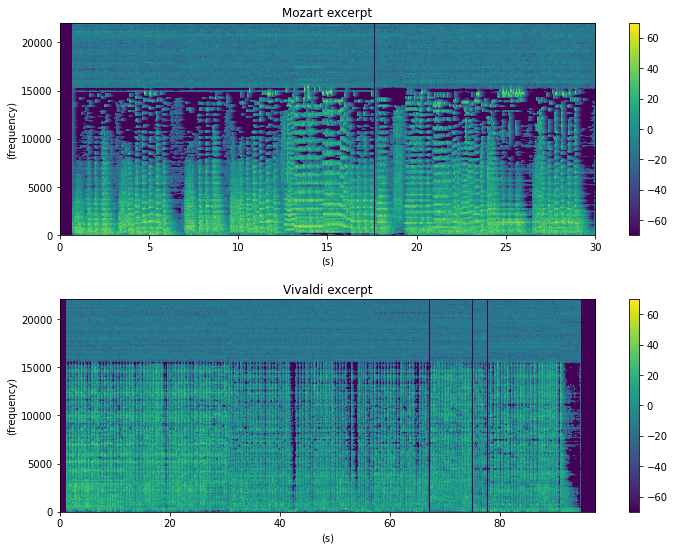

In [14]:
f, ax = plt.subplots(2)
plt.subplots_adjust(hspace=0.3)

for i, (snr_spectral, title) in enumerate(
    ((snr_spectral_mozart, "Mozart"),
     (snr_spectral_vivaldi, "Vivaldi"))):
    snr_plot = ax[i].matshow(
        10 * np.log10(snr_spectral + EPS),
        aspect='auto',
        origin='lower',
        extent=[0, snr_spectral.shape[1] * 256 / sr, 0, sr / 2],
        vmax=70,
        vmin=-70,
    )
    ax[i].set_title(f"{title} excerpt")
    ax[i].xaxis.set_ticks_position("bottom")
    ax[i].set_ylabel("(frequency)")
    ax[i].set_xlabel("(s)")
    f.colorbar(snr_plot, ax=ax[i])

Mozart's excerpt has more SNR in the low part of the spectrum rather than in the high frequency.
This is perceived as a high-frequency hiss along all the track.
On the other hand, Vivaldi's example has lower SNR but it is more constant along the spectrum.
In both cases, the signal seems to contain information up to 16kHz only.


We can see how the algorithm punishes Vivaldi's case more, although this may not always correlate with the perceived annoyance of the background noise.

## References
[1] Vaseghi, S. V. (2008). Advanced digital signal processing and noise reduction. John Wiley & Sons. Page 336.

[2] Ephraim, Y., & Malah, D. (1984). Speech enhancement using a minimum-mean square error short-time spectral amplitude estimator. IEEE Transactions on acoustics, speech, and signal processing, 32(6), 1109-1121.